# `Практикум по программированию на языке Python`

<br>
<br>

## `Занятие 11: Генеративные состязательные сети (GAN)`

<br>
<br>



### `Оганов Александр (tg: @welmud), Находнов Максим`
### `Москва, 2024`



### `Использованы статьи:`

[Generative Adversarial Networks](https://arxiv.org/abs/1406.2661)

[How to Train GAN](https://github.com/soumith/ganhacks)

[Towards Principled Methods for Training Generative Adversarial Networks
](https://arxiv.org/abs/1701.04862)

[Wasserstein GAN](https://arxiv.org/abs/1701.07875)

[From GAN to WGAN](https://lilianweng.github.io/posts/2017-08-20-gan/)

[Improved Training of Wasserstein GANs](https://arxiv.org/abs/1704.00028)

[WGAN-GP](https://arxiv.org/pdf/1704.00028.pdf)

[f-GAN: Training Generative Neural Samplers using Variational Divergence Minimization
](https://arxiv.org/abs/1606.00709)

### `Материалы, которые используются в ноутбуке:`

[DGM-AIMasters-course seminar8](https://github.com/r-isachenko/2024-DGM-AIMasters-course/blob/5aa2879d9d4091cbed6b8d86900ee36e47489767/seminars/seminar8/seminar8.ipynb)

[DGM-AIMasters-course seminar9](https://github.com/r-isachenko/2024-DGM-AIMasters-course/blob/5aa2879d9d4091cbed6b8d86900ee36e47489767/seminars/seminar9/seminar9.ipynb)

[HSE_DPO_DL Seminar 07](https://github.com/nakhodnov17/HSE_DPO_DL/blob/40bee88bfae8c601f1068d8d70ad0d04078286dd/Seminars/Seminar%2007/Seminar%2007.%20GAN.ipynb)

[HSE_DPO_DL Seminar 07 slides](https://github.com/nakhodnov17/HSE_DPO_DL/blob/40bee88bfae8c601f1068d8d70ad0d04078286dd/Seminars/Seminar%2007/Seminar%2007.%20GAN.pdf)

[разные реализации](https://github.com/eriklindernoren/PyTorch-GAN/tree/master)


[DCGAN](https://arxiv.org/pdf/1511.06434.pdf)



In [1]:
%load_ext autoreload
%autoreload 2

%config Completer.use_jedi = True

In [2]:
import os
import time
import random

import wandb

import numpy as np
import matplotlib_inline
import matplotlib.pyplot as plt
from ml_collections import ConfigDict

import torch
from torchvision.datasets import MNIST

from torchvision.utils import make_grid
import torchvision.transforms as transforms

%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

In [3]:
def set_global_seed(seed: int) -> None:
    """
    Set global seed for reproducibility.
    """

    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    random.seed(seed)
    np.random.seed(seed)

set_global_seed(42)

### `Немного о генеративном моделировании`



На прошлых занятиях вы изучали разные архитектуры, задачи и много разного связанного с глубоким обучением. 

`Вопрос:` Остановимся на задачах, какой тип задач вы много раз решали? 

Подсказка: классификация изображений, сегментация...

<details>

<summary><b>Ответ: (надо кликнуть)</b> </summary> 
Правильно, дискриминативные задачи, а точнее, вы строили дискриминативные модели, так например решая задачу классификации, вы на самом деле задавали следующее параметрическое распределение:   

    
$$ p(y \mid x, \theta)$$
    
</details>



Однако сегодня мы разберем генеративные модели, которые в целом можно записать так:

$$ p(y \mid x, \theta) p(x \mid \theta)$$

В частности нас будет интересовать, как же найти $p(x \mid \theta)$, то есть какое распределение имеют данные.

Сегодня мы поставим цель еще интереснее, мы хотим не просто найти подходящее распределение, но и научиться сэмплировать из него!


Примеры прикладных задач:

1) Генерация изображений, текста, звука

2) Закрашивание, окрашивание, денойзинг изображений

3) И много всякого интересного

### `Генеративные состязательные сети (GAN)` 

Следуем работе [Generative Adversarial Networks](https://arxiv.org/abs/1406.2661)

Мы работаем в предположении, что мы всегда можем обучить идеальную дискриминативную модель (классификатор), которую будем обозначать $D(x)$.


Пусть у нас есть какая-то нейронная сеть $G(z; \theta_g)$ с параметрами $\theta_g$, которую будем называть генератором. Цель генератора получить такие объекты, которые наш идеальный классификатор считал бы настоящими. При этом мы считаем, что $z$ случайные величины, которые сэмплируются из простого распределения (например $\mathcal{N}(0, I)$. Математически задачу генератора можно записать так:

$$\min_{G}\mathbb{E}_{z \sim p(z)}\log(1 - D(G(z; \theta_g))$$

Казалось бы, вот получили мы задачу минимизации, решим ее и все готово, но...

А действительно ли мы решаем такую задачу? Что значит идеальный дискриминатор?

Будем считать, что идеальный классификатор лучше всех отличает сгенерированный объект от настоящего, то есть является решением задачи:


$$\max_{D}\mathbb{E}_{x \sim p_{data}(x)}\log D(x) + \mathbb{E}_{z \sim p(z)}\log(1 - D(G(z; \theta_g))$$

Чем-то напоминает минимизацию кросс энтропии (вернемся к этому позже)...

Тем самым мы получили следующую задачу:

$$\min_{G} \max_{D}\mathbb{E}_{x \sim p_{data}(x)}\log D(x) + \mathbb{E}_{z \sim p(z)}\log(1 - D(G(z; \theta_g))$$

`Вопрос:` Как называются такие задачи?

`Вопрос:` В чем главная проблема в обучении?

Мы задали $G(\cdot; \theta_g)$ как нейросеть, а следовательно мы получаем, что генератор $G$ индуцирует какое-то распределение (так как $z \sim p(z)$). Будем называть распределение генератора $p_g(x)$, а наша цель добиться того, чтобы $p_g(x) = p_{data}(x)$. Сначала нам надо понять, как выглядит идеальный классификатор для фиксированного генератора $G$.

$$ G^*_G(x) = \frac{p_{data}(x)}{p_{data}(x) + p_g(x)}$$

`Вопрос:` Как будет выглядеть выражение если $p_{data} = p_g$?

То есть мы для генератора мы получили задачу:
    
$$ \min_G  \mathbb{E}_{x \sim p_{data}(x)}\log \frac{p_{data}(x)}{p_{data}(x) + p_g(x)} + \mathbb{E}_{x \sim p_g(x)}\log\frac{p_{g}(x)}{p_{data}(x) + p_g(x)}$$

Выглядит как-то знакомо...

`Вопрос`: Чему равен минимум выражения при идеальном генераторе ($p_g = p_{data}$)?

`Вопрос:` На сумму каких стандартных функционалов вам напоминает полученное выражение?

`Подсказка:` Когда мы говорим о распределения, стоит задуматься о дивергенциях

На самом деле при наличии идеального классификатора мы получим, что задача генератора:


$$−\log4 + KL(p_{data}\| \frac{p_{data} + p_g}{2}) + KL(p_g \| \frac{p_{data} + p_g}{2}) \to \min_G$$

И если мы бы знали все дивергенции на свете, то смогли бы увидеть дивергенцию Йенсена-Шеннона, которая определяется как:

$$ JSD(p_{data} \| p_g) = \frac{1}{2}KL(p_{data}\| \frac{p_{data} + p_g}{2}) + \frac{1}{2}KL(p_g \| \frac{p_{data} + p_g}{2}) $$

То есть, на самом деле, для генератора мы решаем задачу:

$$ −\log4 + 2 JSD(p_{data} \| p_g) \to \min_G$$

`Вопрос:` Какие возникнут проблемы при решение этой задачи на практике?

### `Чем плоха дивергенция?`

`Forward KL vs Reverse KL vs JSD`

Далее будем использовать стандартные обозначения:

$\pi(x)$ — распределение данных

$p(x \mid \mu, \sigma)$ — настраиваемое распределение

In [4]:
single_gaussian = torch.distributions.Normal(
    loc=torch.tensor(0.), 
    scale=torch.tensor(1.)
)

In [5]:
mixture_gaussian = torch.distributions.MixtureSameFamily(
    mixture_distribution=torch.distributions.Categorical(probs=torch.tensor([0.8, 0.2])),
    component_distribution=torch.distributions.Normal(
        loc=torch.tensor([-2., 2.]), 
        scale=torch.tensor([0.5, 0.5])
    )
)

In [6]:
X = torch.linspace(-6, 6, 500, dtype=torch.float32)

In [7]:
@torch.no_grad()
def plot_distributions(X, real_log_prob, model_log_prob=None, title=None, ax=None):
    res1 = real_log_prob(X).exp()
    if model_log_prob is not None:
        res2 = model_log_prob(X).exp()

    if ax is None:
        (fig, ax), show = plt.subplots(1, 1, figsize=(6, 4)), True 
    else:
        show = False
        
    ax.plot(X.numpy(), res1.numpy(), color='b', linewidth=3, label=r'$\pi(\mathbf{x})$')
    ax.fill_between(X.numpy(), np.zeros_like(X.numpy()), res1.numpy(),  color='b', alpha=0.2)
    
    if model_log_prob is not None:
        ax.plot(X.numpy(), res2.numpy(), 'g', linewidth=3, label=r'$p(\mathbf{x} | \mu, \sigma)$')
        ax.fill_between(X.numpy(), np.zeros_like(X.numpy()), res2.numpy(),  color='g', alpha=0.2)
    
    if title is not None:
        ax.set_title(title)
    
    ax.legend()
    ax.grid(True)
    ax.set_xlabel('support')
    
    if show:
        fig.tight_layout()
        plt.show()

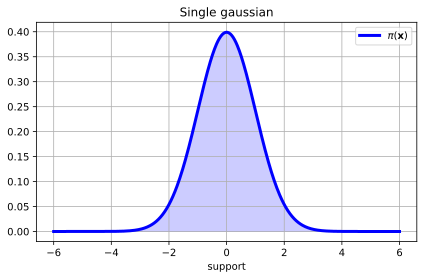

In [8]:
plot_distributions(X, single_gaussian.log_prob, title='Single gaussian')

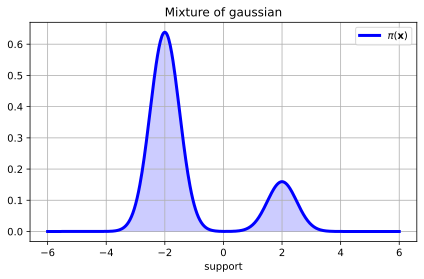

In [9]:
plot_distributions(X, mixture_gaussian.log_prob, title='Mixture of gaussian')

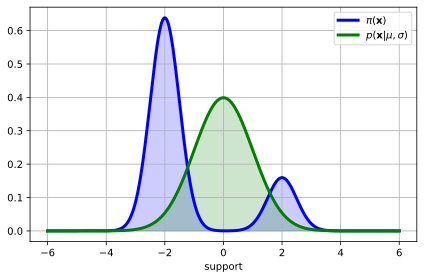

In [10]:
plot_distributions(X, mixture_gaussian.log_prob, single_gaussian.log_prob)

$$
\text{KL}(\pi || p) = \int \pi(x) \log \frac{\pi(x)}{p(x)}dx,\; \text{KL}(p || \pi) = \int p(x) \log \frac{p(x)}{\pi(x)}dx
$$

$$
\text{JSD}(\pi || p) = \frac{1}{2} \Bigg[ \text{KL}\Big(\pi(x) || \frac{\pi(x) + p(x)}{2}\Big) + \text{KL}\Big(p(x) || \frac{\pi(x) + p(x)}{2}\Big) \Bigg]
$$

In [11]:
def KLD(X, log_prob1, log_prob2):
    dt = (X.max() - X.min()) / len(X)
    return (log_prob1(X).exp() * (log_prob1(X) - log_prob2(X))).sum() * dt

def JSD(X, log_prob1, log_prob2):
    def log_prob_mean(x):
        prob_mean = (log_prob1(x).exp() + log_prob2(x).exp()) / 2.0
        return prob_mean.log()
    
    return (KLD(X, log_prob1, log_prob_mean) + KLD(X, log_prob2, log_prob_mean)) / 2.0

In [12]:
def get_trainable_gaussian(mu=-1.0, sigma=0.5):
    mu = torch.tensor(mu, requires_grad=True, dtype=torch.double)
    sigma = torch.tensor(sigma, requires_grad=True, dtype=torch.double)
    
    single_gaussian = torch.distributions.Normal(mu, sigma)
    optimizer = torch.optim.SGD([mu, sigma], lr=0.1)
    
    return single_gaussian, optimizer

In [13]:
forward_KL_loss_fn = lambda X, real_log_prob, model_log_prob: KLD(X, real_log_prob, model_log_prob)
reverse_KL_loss_fn = lambda X, real_log_prob, model_log_prob: KLD(X, model_log_prob, real_log_prob)
JSD_loss_fn = lambda X, real_log_prob, model_log_prob: JSD(X, real_log_prob, model_log_prob)

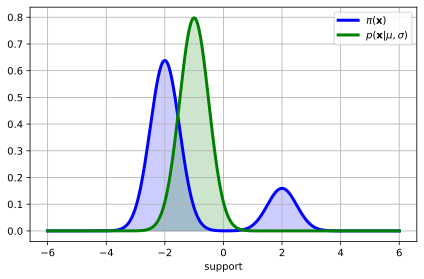

In [14]:
single_gaussian, _ = get_trainable_gaussian()

plot_distributions(X, mixture_gaussian.log_prob, single_gaussian.log_prob)

In [15]:
def solve_task(optimizer, loss_fn, real_log_prob, model_log_prob, epochs, verbose=True):
    n_plots = (epochs // 10) * verbose + 2
    n_rows, n_cols = (n_plots - 1) // 3 + 1, 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 2.5 * n_rows), sharex=True, sharey=True)
    axes = axes.reshape(-1)
    
    plot_distributions(X, real_log_prob, model_log_prob, title=f'Initialization', ax=axes[0])
    
    for epoch in range(epochs):
        optimizer.zero_grad()

        loss = loss_fn(X, real_log_prob, model_log_prob)
        loss.backward()
        optimizer.step()

        if verbose and epoch % 10 == 0: 
            plot_distributions(
                X, real_log_prob, model_log_prob, 
                title=f'Step: {epoch}, loss: {loss:.2f}', ax=axes[epoch // 10 + 1]
            )
            
    plot_distributions(X, real_log_prob, model_log_prob, title=f'Final', ax=axes[-1])
    
    fig.tight_layout()
    plt.show()

### `Forward KL optimization`

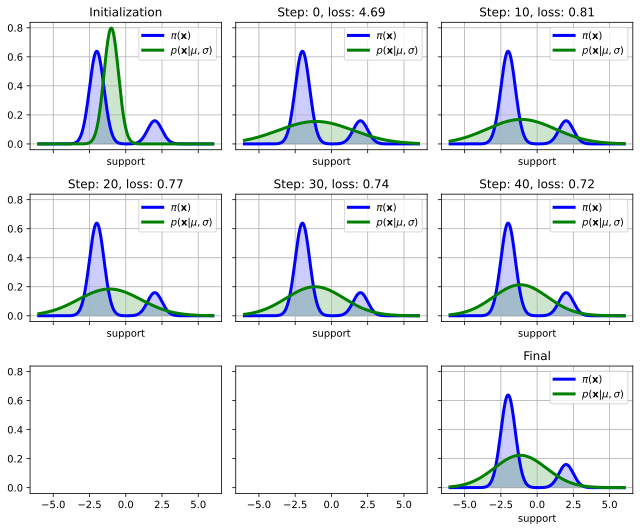

In [16]:
single_gaussian, optimizer = get_trainable_gaussian()

solve_task(optimizer, forward_KL_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50)

### `Reverse KL optimization`

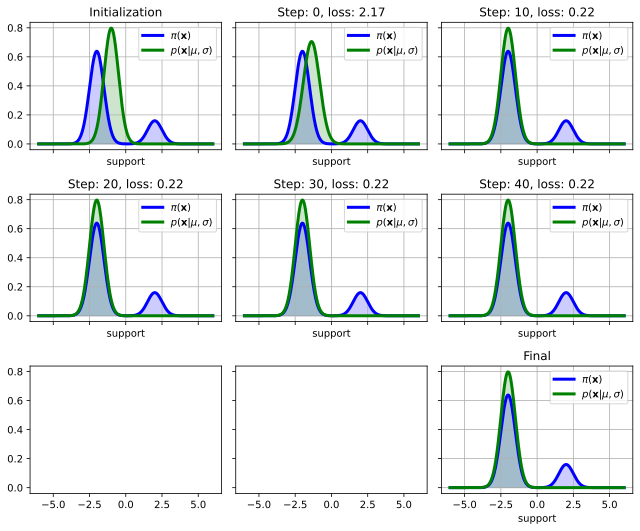

In [17]:
single_gaussian, optimizer = get_trainable_gaussian()

solve_task(optimizer, reverse_KL_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50)

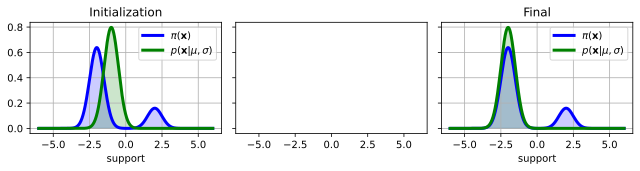

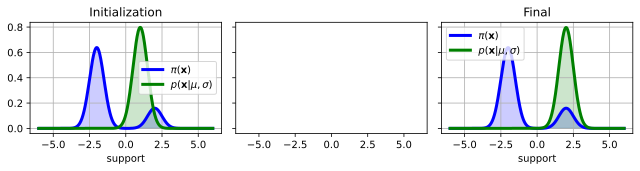

In [18]:
for mu in [-1.0, 1.0]:
    single_gaussian, optimizer = get_trainable_gaussian(mu=mu)
    solve_task(
        optimizer, reverse_KL_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, 
        epochs=50, verbose=False
    )

### `Jensen Shannon optimization`

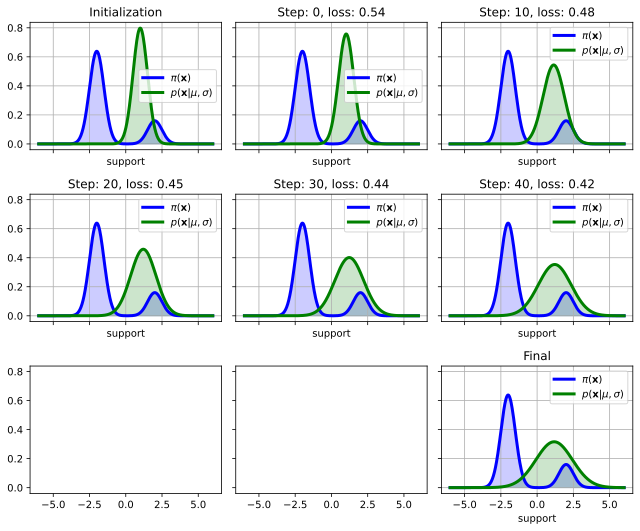

In [19]:
single_gaussian, optimizer = get_trainable_gaussian(mu=1.0)

solve_task(optimizer, JSD_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50)

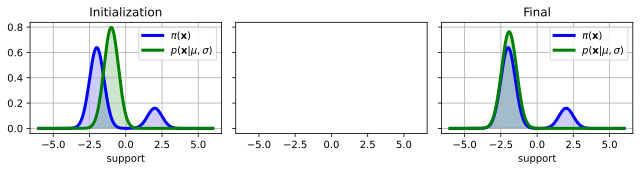

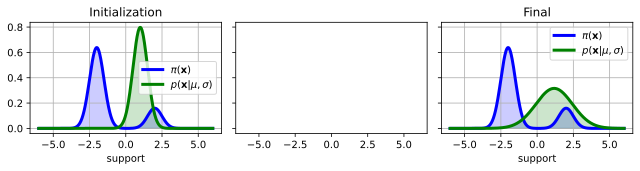

In [20]:
for mu in [-1.0, 1.0]:
    single_gaussian, optimizer = get_trainable_gaussian(mu=mu)
    solve_task(
        optimizer, JSD_loss_fn, mixture_gaussian.log_prob, single_gaussian.log_prob, epochs=50, verbose=False
    )

### `Обучение GAN`

In [21]:
def plot_gan_data(noise_fn, data_fn, data_pdf=None, samples=5000):
    noise = noise_fn(samples).numpy().flatten()
    target = data_fn(samples).numpy().flatten()
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    
    ax.hist(noise, label='noise', alpha=0.5, density=True, color='b')
    ax.hist(target, label='target', alpha=0.5, density=True, color='g')
    if data_pdf is not None:
        x = np.linspace(-6, 6, 100)
        ax.plot(x, data_pdf(x), 'g', label='real distribution')

    ax.grid(True)
    ax.legend(loc='upper left')
    
    fig.tight_layout()
    plt.show()
    
def plot_gan_loss(loss_g, loss_d_real, loss_d_fake):
    fig, ax = plt.subplots(1, 2, figsize=(9, 3))
    
    ax[0].plot(loss_g)
    
    ax[1].plot(loss_d_real, label="real")
    ax[1].plot(loss_d_fake, label="fake")
    ax[1].plot(loss_d_real + loss_d_fake, label="all")
    
    ax[1].legend()
    
    ax[0].grid(True)
    ax[1].grid(True)
    
    ax[0].set_title("Generator loss")
    ax[1].set_title("Discriminator loss")
    
    fig.tight_layout()
    plt.show()
    
@torch.no_grad()
def visualize_GAN(gan, data_pdf=None, ax=None):
    size = 500
    x = np.linspace(-6, 6, 100)
    bins = np.linspace(-6, 6, 60)
    
    real_data = gan.data_fn(size)
    noise = gan.noise_fn(size)
    sampled_data = gan.generate_samples(noise)
    d_probs = gan.D(torch.from_numpy(x).float().unsqueeze(-1))
    
    if ax is None:
        (fig, ax), show = plt.subplots(1, 1, figsize=(6, 4)), True
    else:
        show = False
    
    ax.plot(x, d_probs.numpy(), 'b', label='D distribution')
    
    ax.hist(noise.numpy(), label='noise', alpha=0.5, density=True, color='b', bins=bins)
    ax.hist(real_data.numpy(), label='real data', alpha=0.5, density=True, color='g', bins=bins)
    ax.hist(sampled_data.numpy(), label='G samples', alpha=0.5, density=True, color='r', bins=bins)
    
    if data_pdf is not None:
        ax.plot(x, data_pdf(x), 'g', label='real distribution')

    ax.grid(True)
    ax.legend(loc='upper left')
    
    if show:
        fig.tight_layout()
        plt.show()

In [22]:
class VanillaGAN(torch.nn.Module):
    def __init__(
        self, G, D, noise_fn, data_fn, batch_size, lr_G=2e-4, lr_D=1e-3
    ):
        """A GAN class for holding and training a generator and discriminator
        Args:
            G: a Generator network
            D: A Discriminator network
            noise_fn: function f(num: int) -> pytorch tensor, (latent vectors)
            data_fn: function f(num: int) -> pytorch tensor, (real samples)
            batch_size: batch size for training
            lr_G: learning rate for the generator
            lr_D: learning rate for the discriminator
        """
        super().__init__()
        
        self.G = G
        self.D = D
        
        self.noise_fn = noise_fn
        self.data_fn = data_fn
        
        self.batch_size = batch_size
        
        self.criterion = torch.nn.BCELoss()
        
        self.optim_G = torch.optim.Adam(
            G.parameters(), lr=lr_G, betas=(0.5, 0.999)
        )
        self.optim_D = torch.optim.Adam(
            D.parameters(), lr=lr_D, betas=(0.5, 0.999)
        )
        
        self.register_buffer(
            'target_zeros', torch.zeros((self.batch_size, 1), dtype=torch.float32), persistent=False
        )
        self.register_buffer(
            'target_ones', torch.ones((self.batch_size, 1), dtype=torch.float32), persistent=False
        )
    
    @torch.no_grad()
    def generate_samples(self, latents=None, n=None):
        """Sample from the generator.
        Args:
            latents: A pytorch latent vector
            n: number of generated samples
        vectors.
        ! We don't need grad for generated samples
        """
        
        if latents is None:
            latents = self.noise_fn(self.batch_size if n is None else n)
        else:
            assert n is None
        
        return self.G(latents)

    def train_step_G(self):
        """Train the generator one step and return the loss."""
        self.optim_G.zero_grad()
        
        latents = self.noise_fn(self.batch_size)
        
        generated = self.G(latents)
        classifications = self.D(generated)
        
        loss = self.criterion(classifications, self.target_ones)
        loss.backward()
        
        self.optim_G.step()
        
        return loss.item()

    def train_step_D(self):
        """Train the discriminator one step and return the losses."""
        self.optim_D.zero_grad()
        
        # Compute loss for samples from data distribution
        real_samples = self.data_fn(self.batch_size)
        pred_real = self.D(real_samples)
        loss_real = self.criterion(pred_real, self.target_ones)

        # Compute loss for fake samples
        latents = self.noise_fn(self.batch_size)
        
        fake_samples = self.generate_samples(latents)
        pred_fake = self.D(fake_samples)
        loss_fake = self.criterion(pred_fake, self.target_zeros)

        # Combine losses
        loss = (loss_real + loss_fake) / 2
        loss.backward()
        
        self.optim_D.step()
        
        return loss_real.item(), loss_fake.item()

In [23]:
def get_simple_model(hidden_sizes):
    assert len(hidden_sizes) > 1

    network = torch.nn.Sequential()
    for in_features, out_features in zip(hidden_sizes[:-2], hidden_sizes[1:-1]):
        network.append(torch.nn.Linear(in_features, out_features))
        network.append(torch.nn.ReLU())

    network.append(torch.nn.Linear(hidden_sizes[-2], hidden_sizes[-1]))

    return network

In [24]:
def noise_fn(x):
    return torch.rand((x, 1)) - 0.5

In [25]:
mixture_gaussian = torch.distributions.MixtureSameFamily(
    torch.distributions.Categorical(torch.tensor([0.7, 0.3])), 
    torch.distributions.Normal(
        loc=torch.tensor([-3., 3.]), 
        scale=torch.tensor([1., 1.])
    )
)

def data_fn(x):
    return mixture_gaussian.sample((x, 1))

def data_pdf(x):
    return mixture_gaussian.log_prob(torch.tensor(x)).exp().numpy()

In [26]:
def get_GAN(G_hidden_sizes=(1, 64, 64, 64, 1), D_hidden_sizes=(1, 64, 64, 64, 1)):
    G = get_simple_model(G_hidden_sizes)
    D = get_simple_model(D_hidden_sizes).append(torch.nn.Sigmoid())

    gan = VanillaGAN(G, D, noise_fn, data_fn, batch_size=32)
    
    return gan

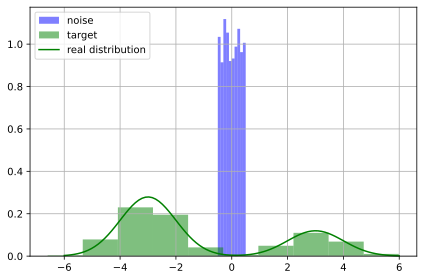

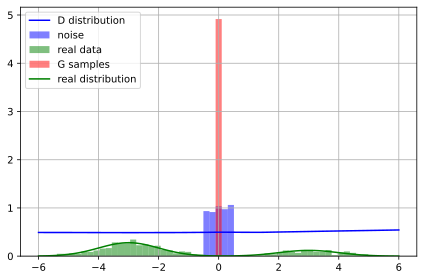

In [27]:
gan = get_GAN()

plot_gan_data(noise_fn, data_fn, data_pdf)
visualize_GAN(gan, data_pdf=data_pdf)

In [28]:
def train_1D_GAN(gan, n_batches=100, epochs=50, n_D_steps_per_G=1):
    def is_logging_epoch(epoch):
        return (epoch % 10 == 0 or epoch == epochs - 1)
    
    start_time = time.time()

    loss_g, loss_d_real, loss_d_fake = [], [], []
    for epoch in range(epochs):
        loss_g_running, loss_d_real_running, loss_d_fake_running = 0.0, 0.0, 0.0
        
        if is_logging_epoch(epoch):
            fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharex=True, sharey=True)
            
        for idx in range(n_batches):
            if idx == 0 and is_logging_epoch(epoch):
                axes[0].set_title('Train D for one batch: start')
                visualize_GAN(gan, data_pdf=data_pdf, ax=axes[0])
                
            for _ in range(n_D_steps_per_G):
                loss_D_real_batch, loss_D_fake_batch = gan.train_step_D()
                loss_d_real_running += loss_D_real_batch
                loss_d_fake_running += loss_D_fake_batch
                
            if idx == 0 and is_logging_epoch(epoch):
                axes[1].set_title('Train D for one batch: end')
                visualize_GAN(gan, data_pdf=data_pdf, ax=axes[1])

            loss_G_batch = gan.train_step_G()
            loss_g_running += loss_G_batch

        loss_g.append(loss_g_running / n_batches)
        loss_d_real.append(loss_d_real_running / (n_batches * n_D_steps_per_G))
        loss_d_fake.append(loss_d_fake_running / (n_batches * n_D_steps_per_G))
        
        if is_logging_epoch(epoch):
            fig.suptitle(
                "Epoch {0}/{1} ({2:.1f}s): G={3:.3f}, Dr={4:.3f}, Df={5:.3f}".format(
                    epoch + 1, epochs, time.time() - start_time, 
                    loss_g[-1], loss_d_real[-1], loss_d_fake[-1]
                )
            )
            axes[2].set_title('After epoch')
            visualize_GAN(gan, data_pdf=data_pdf, ax=axes[2])

            fig.tight_layout()
            plt.show()
        
    return np.array(loss_g), np.array(loss_d_real), np.array(loss_d_fake)

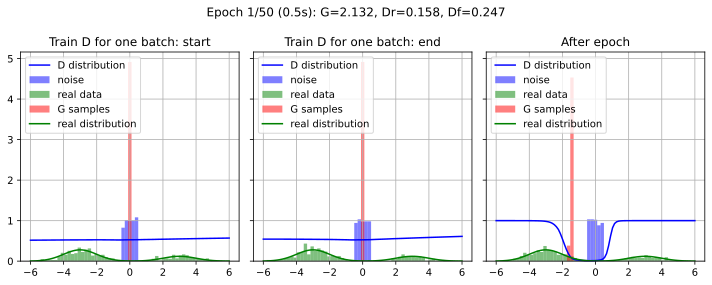

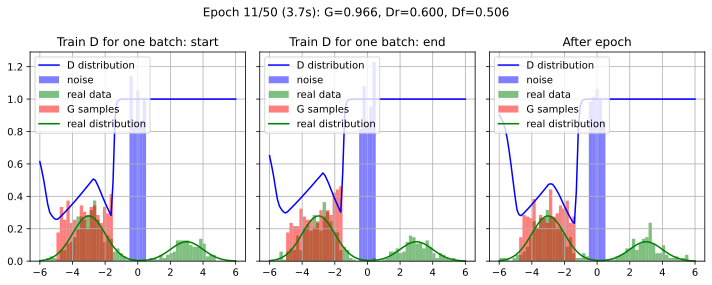

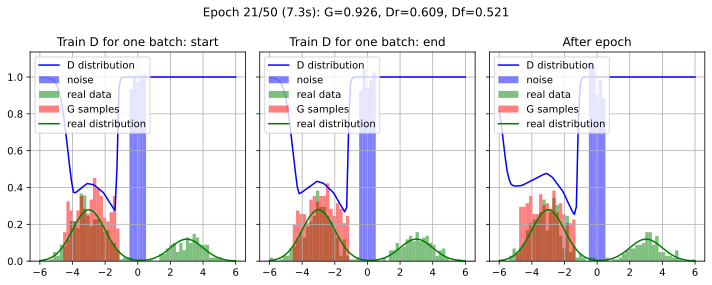

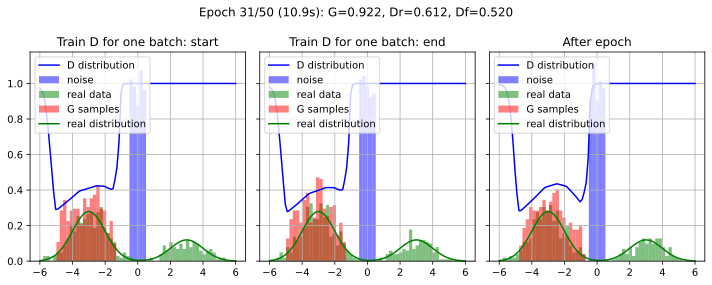

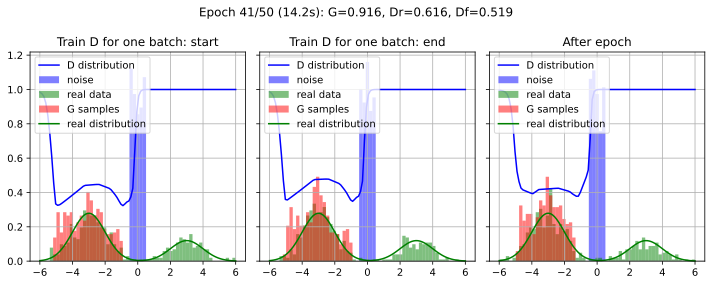

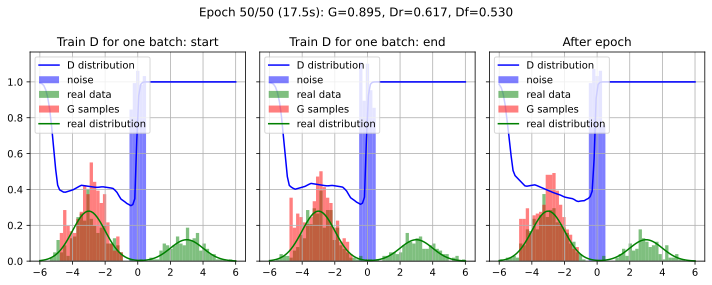

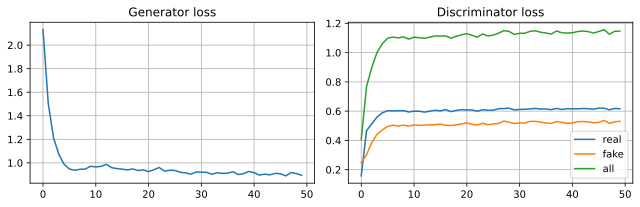

In [29]:
set_global_seed(0)

gan = get_GAN()
loss_g_1, loss_d_real_1, loss_d_fake_1 = train_1D_GAN(gan)
plot_gan_loss(loss_g_1, loss_d_real_1, loss_d_fake_1)

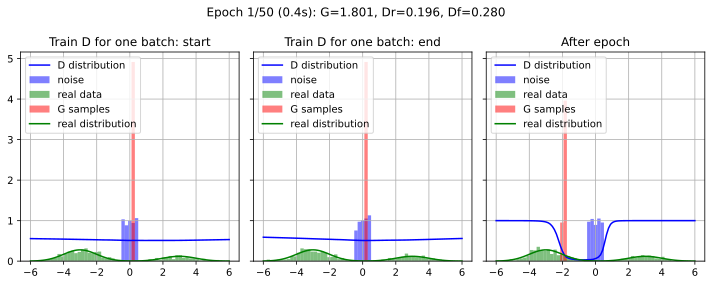

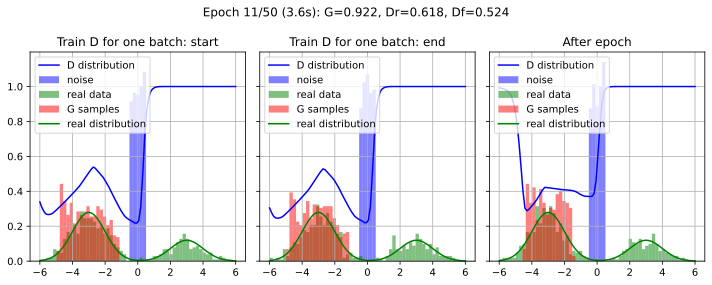

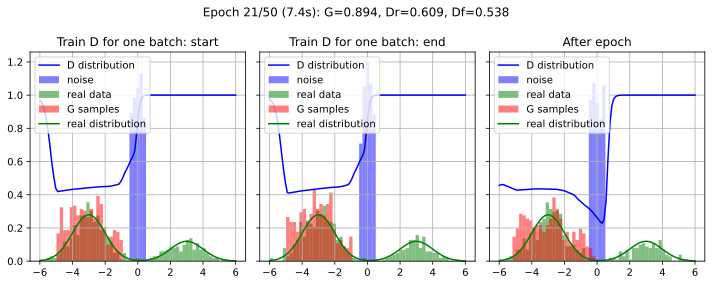

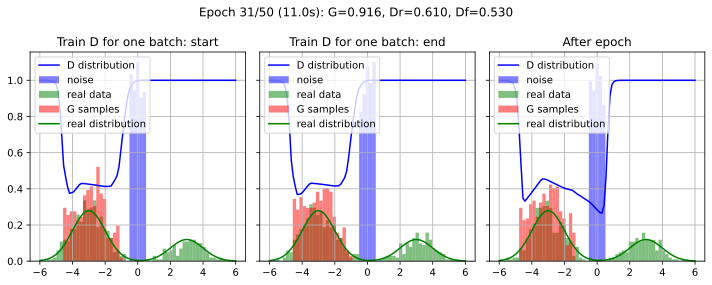

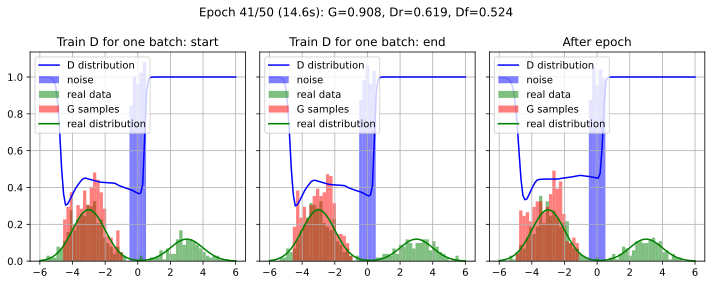

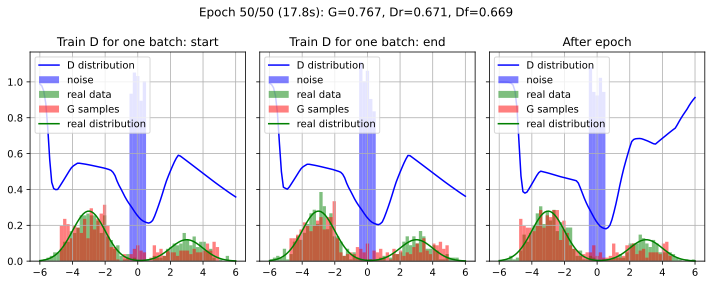

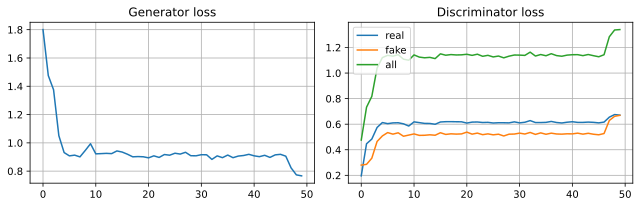

In [30]:
set_global_seed(3)

gan = get_GAN()
loss_g_1, loss_d_real_1, loss_d_fake_1 = train_1D_GAN(gan)
plot_gan_loss(loss_g_1, loss_d_real_1, loss_d_fake_1)

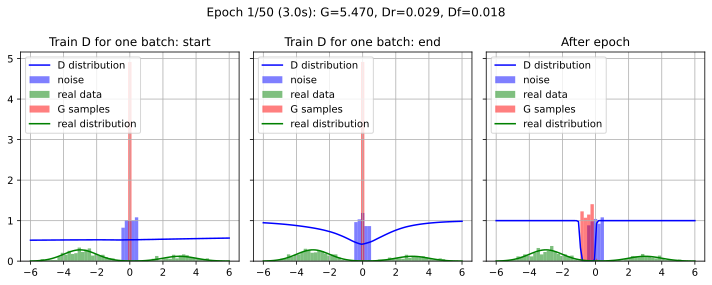

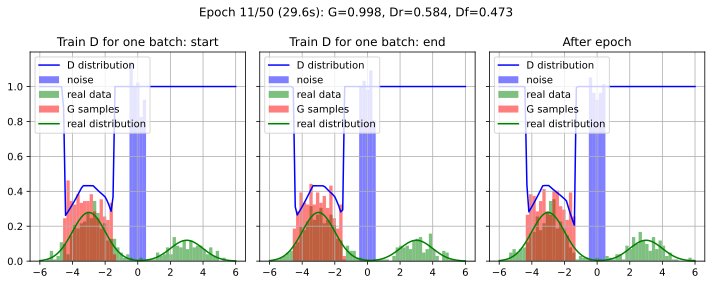

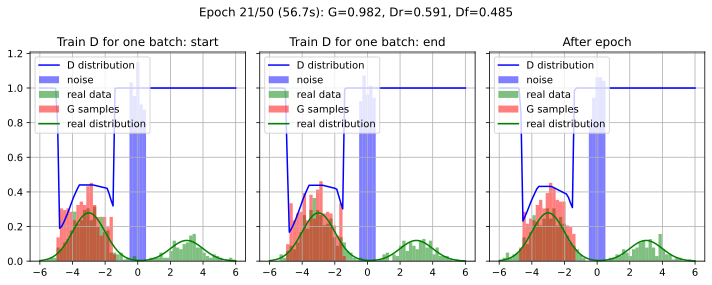

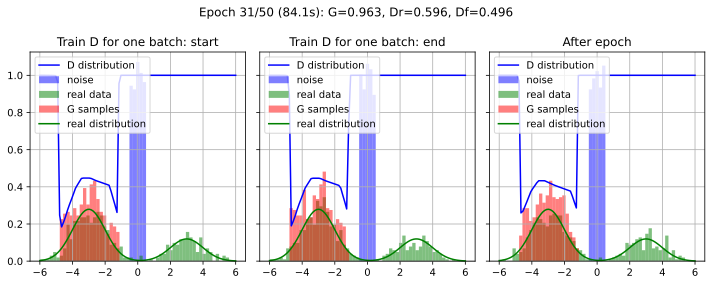

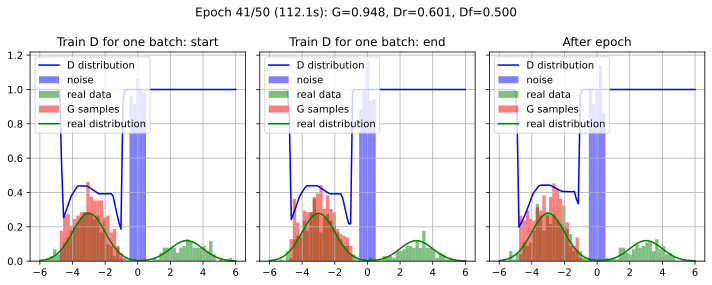

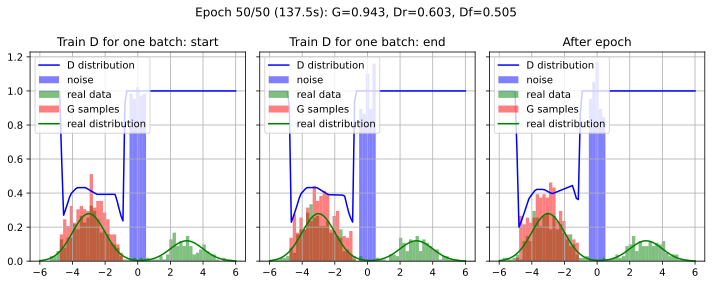

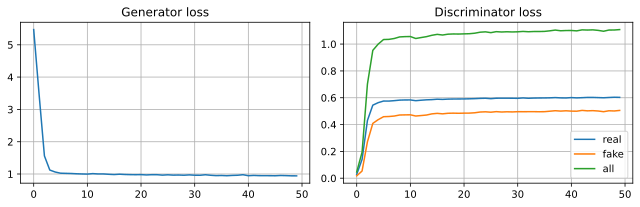

In [31]:
set_global_seed(0)

gan = get_GAN()
loss_g_20, loss_d_real_20, loss_d_fake_20 = train_1D_GAN(gan, n_D_steps_per_G=20)
plot_gan_loss(loss_g_20, loss_d_real_20, loss_d_fake_20)

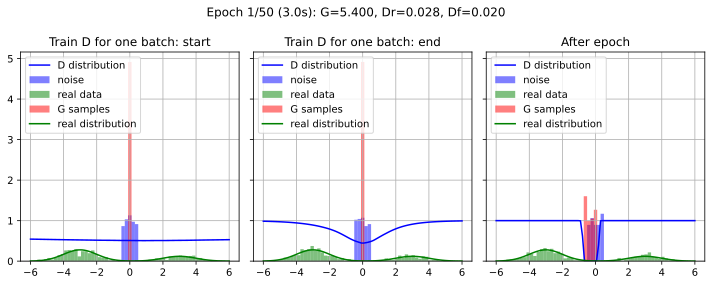

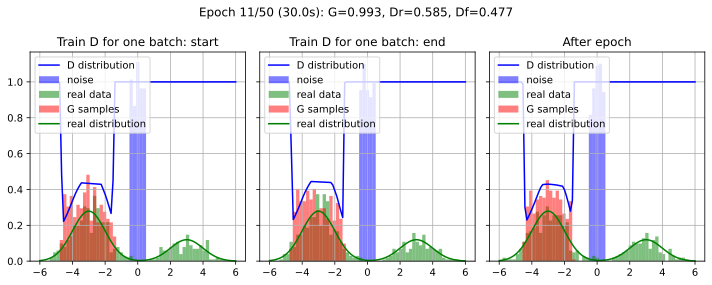

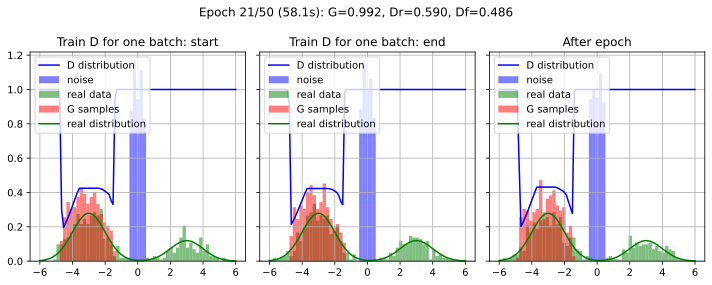

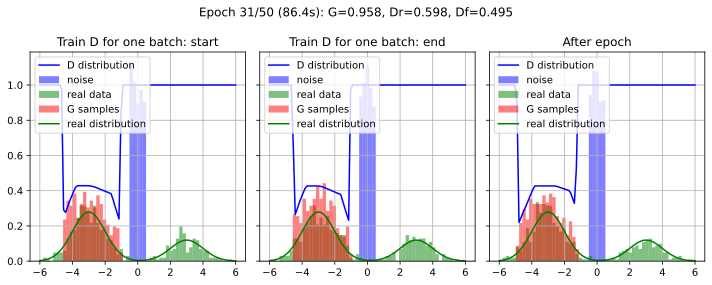

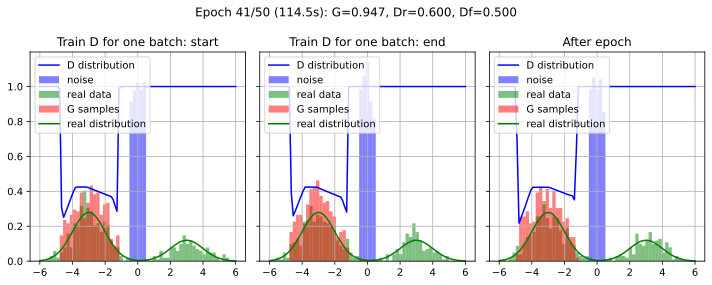

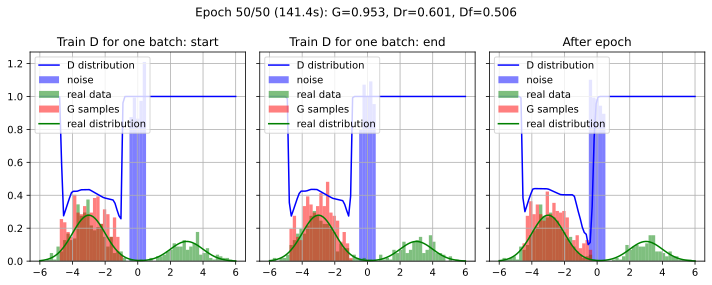

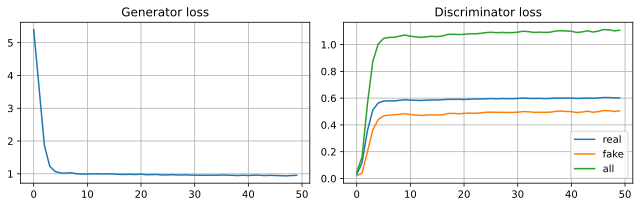

In [32]:
set_global_seed(2)

gan = get_GAN()
loss_g_20, loss_d_real_20, loss_d_fake_20 = train_1D_GAN(gan, n_D_steps_per_G=20)
plot_gan_loss(loss_g_20, loss_d_real_20, loss_d_fake_20)

### `Проблемы`

Как мы видели выше, чаще всего мы получаем данные из одной моды, что является следствием нашего функционала. После такого печального результата мы можем задуматься, а действительно ли $GAN$ модели обучаемы?

Обучаемы, но есть нюанс!

Ниже представлены примеры сгенерированных изображений из оригинальной статьи (2014 год)

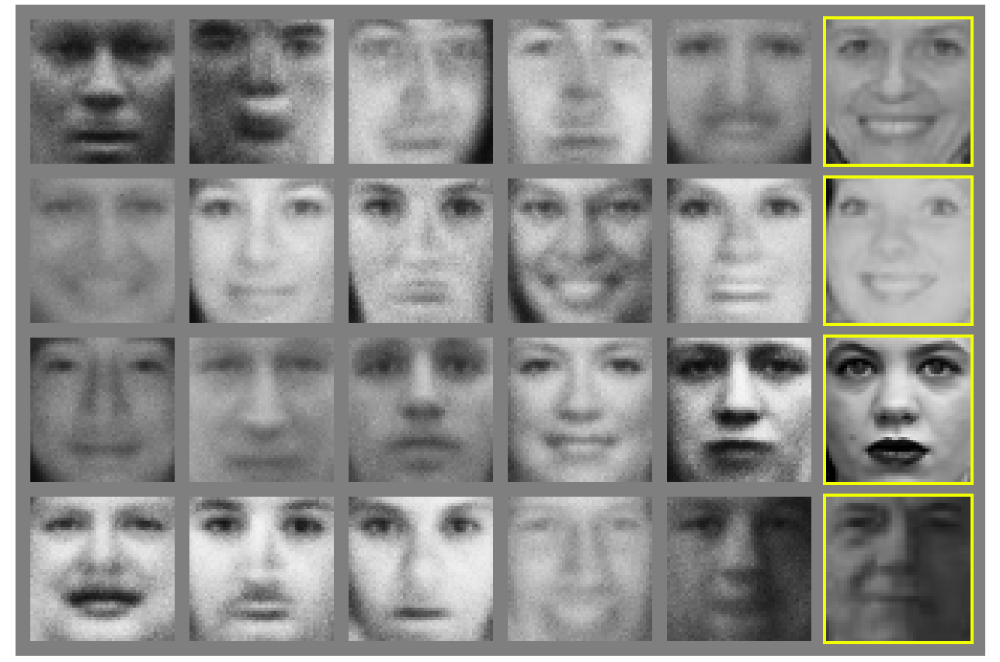

[DCGAN с кодом](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) с реализацией на PyTorch, получает такие сэмплы (2016 год)

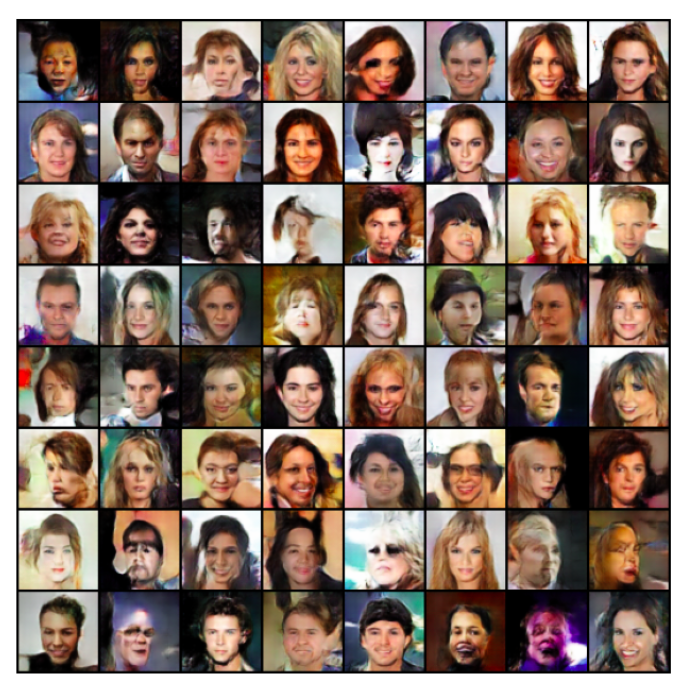

Прошло 2 года, при этом качество генерации заметно возросло, что же поменялось за это время?

1) Люди перешли к сверточным нейронным сетям и стали использовать модели с большим числом параметров

2) Научились правильнее настраивать параметры модели и архитектуры

Но самое важное, придумал кучу разных лайфхаков, как учить $GAN$. Примеры: [ОБЯЗАТЕЛЬНО К ПРОЧТЕНИЮ](https://github.com/soumith/ganhacks), [менее ОБЯЗАТЕЛЬНО К ПРОЧТЕНИЮ](https://arxiv.org/pdf/1701.04862.pdf)

К счастью, ни одними инженерными лайфхаками мы едины, поэтому в 2017 году был предложена модель Wasserstein $GAN$ или кратко — $WGAN$

##  `GAN и математика` 

Выше мы показали, что проблема мод коллапса, может быть, следствием вида функционала для обучения генератора. Откуда возникает идея: а как мы можем поменять функцию потерь, но сохранить идею модели?

Для этого ненадолго заглянем в раздел математики, под названием `оптимальный транспорт`

### `Оптимальный транспорт`



`Расстояние Вассерштейна (дискретное)`

(Неформальное определение) Минимальная стоимость перемещения и преобразования кучи грунта в форме одного распределения вероятности в форму другого распределения.

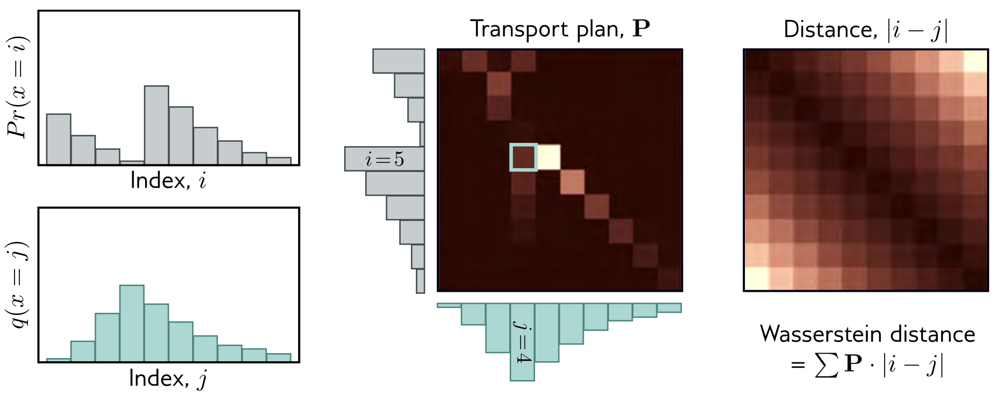
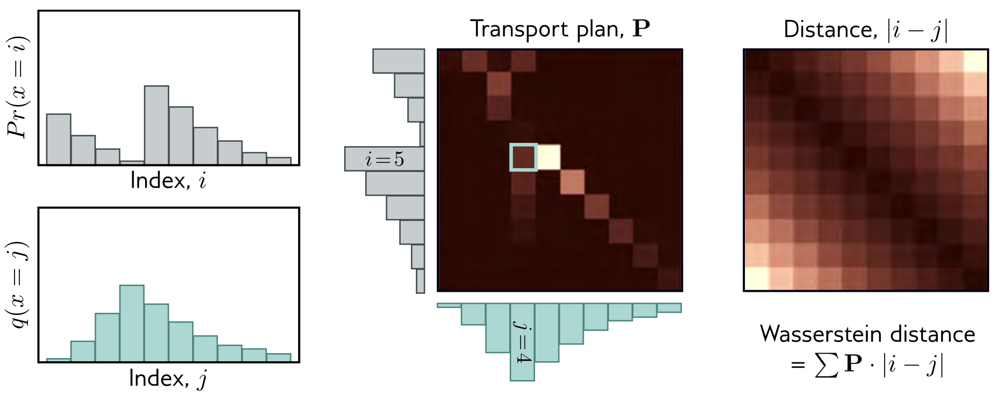

`Расстояние Вассерштейна (непрерывное)`
$$W(\pi, p) = \inf_{\gamma \in \Gamma(\pi, p)} \mathbb{E}_{(\mathbf{x}, \mathbf{y}) \sim \gamma} \| \mathbf{x} - \mathbf{y} \| =  \inf_{{\gamma}\in {\Gamma(\pi, p)}} \int { \| \mathbf{x} - \mathbf{y} \|} {\gamma (\mathbf{x}, \mathbf{y})} d \mathbf{x} d \mathbf{y} $$


$\gamma (\mathbf{x}, \mathbf{y})$ — транспортный план (количество "грунта" которое нужно сместить с точки $\mathbf{x}$ в точку $\mathbf{y}$)

$$\int \gamma(\mathbf{x}, \mathbf{y}) d \mathbf{x} = p(\mathbf{y}); \quad \int \gamma(\mathbf{x}, \mathbf{y}) d \mathbf{y} = p(\mathbf{x}) $$


${\ \Gamma(\pi, p)}$ — множество  всех возможных совместных распределений $\gamma (\mathbf{x}, \mathbf{y})$ with marginals $\pi$ and $p$.

${\gamma(\mathbf{x}, \mathbf{y})}$ — масса

${\| \mathbf{x} - \mathbf{y} \|}$ — расстояние
	
Мы будем использовать $W(\pi, p)$ для задачи оптимального транспорта (есть разные варианты метрики Вассерштейна, как и разные вариант $L_p$ норм)


Можно доказать, что для любой последовательность $\{ p_t \}_{t=1}^{\infty}$ на компакте, такой что верно $D_{KL}(\pi \| p_t) \to 0$, при $t \to \infty$ будет верно:

$$W(\pi, p_t) \to 0, \quad t \to \infty$$

`Теорема (двойственность Кантаровича-Рубенштейна)`

$$W(\pi || p) = \frac{1}{K} \max_{\| f \|_L \leq K} \left[ \mathbb{E}_{\pi(\mathbf{x})} f(\mathbf{x})  - \mathbb{E}_{p(\mathbf{x})} f(\mathbf{x})\right]$$


где $f : \mathbb{R}^n \rightarrow \mathbb{R} $, $\| f \|_L \leq K$, то есть $f$ является $K-$ Липшицева непрерывная функция ($f: \mathcal{X} \rightarrow \mathbb{R}$)
	
Осталось только, научиться минимизировать $W(\pi || p)$, например использовать Монте-Карло оценку, правда?...


К сожалению нет, нужно еще научиться задавать Липшицивы функции с помощью нейронной сети... 

`Появляется новый вопрос`: как влиять на рост функции, которая задана нейронной сетью?

`Ответ`: загонять веса модели в какой-нибудь компакт (чаще всего этого достаточно)


Теперь нам нужно убедиться, что $f$ является непрерывным по $K$-непрерывной Липшицевой функцией.


Пусть $f_ {\phi} (\mathbf {x})$ — нейронная сеть прямого действия, параметризованная $\phi$. Если параметры $\phi$ лежат в компакте $\boldsymbol{\Phi}$, то $f_{\phi}(\mathbf{x})$ будет $K$-непрерывной Липшицевой функцией

Пусть параметры будут привязаны к фиксированному компакту $\boldsymbol{\Phi} \in [-c, c]^d$ (например, $c = 0.01$) после каждого обновления градиента.
		
$$ K \cdot W(\pi || p) = \max_{\| f \|_L \leq K} \left[ \mathbb{E}_{\pi(\mathbf{x})} f(\mathbf{x})  - \mathbb{E}_{p(\mathbf{x})} f(\mathbf{x})\right] \geq \\  \geq \max_{\phi \in \boldsymbol{\Phi}} \left[ \mathbb{E}_{\pi(\mathbf{x})} f_{\phi}(\mathbf{x})  - \mathbb{E}_{p(\mathbf{x})} f_{\phi}(\mathbf{x})\right]$$
	

### `Необходимое условие решения`

Оказывается, если функция $f$ — 1-Липшицева дифференцируемая функция, кроме того, $f$ является решением задачи оптимального транспорта в смысле двойственности Кантаровича-Рубенштейна, то будет верно следующее:


$$\mathbb{P}_{(\mathbf{y}, \mathbf{z}) \sim \gamma}  \left[ \nabla f(\hat{\mathbf{x}}_t) = \frac{\mathbf{z} - \hat{\mathbf{x}}_t}{\| \mathbf{z} - \hat{\mathbf{x}}_t \| } \right] = 1$$

где $\hat{\mathbf{x}}_t = t\mathbf{y} + (1 - t) \mathbf{z}$

В частности нам важно, что почти наверно $ \nabla f(\hat{\mathbf{x}}_t) = 1$, будем это требовать у нейронной сети (то есть штрафовать за отклонения нормы градиента от 1)

Тем самым получим $WGAN$ с gradient penalty [WGAN-GP](https://arxiv.org/pdf/1704.00028.pdf)


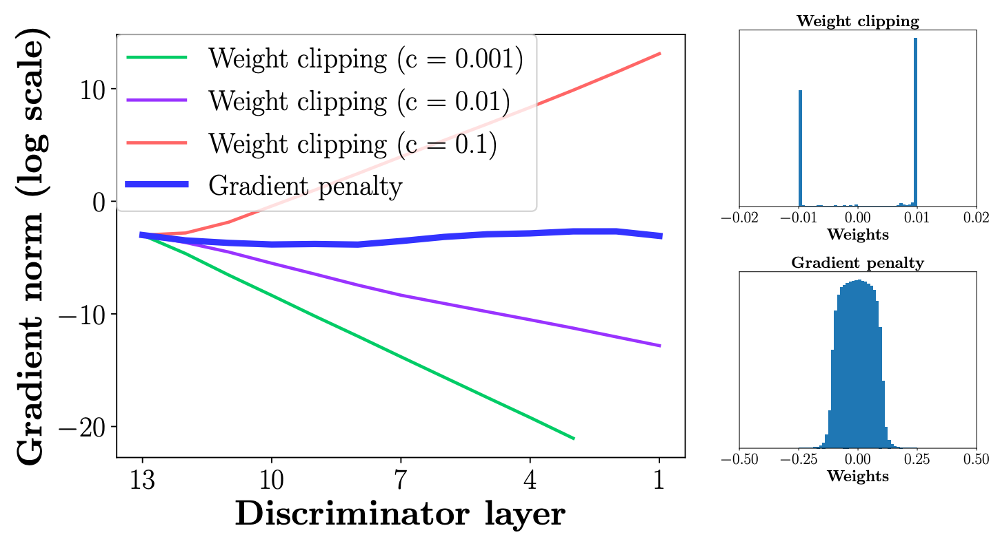

### $f-$`дивергенция`

Выше мы выводили $GAN$ для $JSD$, теперь для расстояния Вассерштейна, а может ли быть так, что это все частные записи какой-то дивергенции записанной в общем виде?

Да, существует понятие $f-$дивергенции, мы не будем вводить строгое определение, но при некоторых условиях на функцию $f$, мы можем получить, что многие дивергенции можно записать как $D_f(\pi \| p):= \mathbb{E}_{p(x)} f(\frac{\pi}{p})$. Пример $GAN$ с разными функциями $f$ [f-GAN: Training Generative Neural Samplers using Variational Divergence Minimization
](https://arxiv.org/abs/1606.00709)



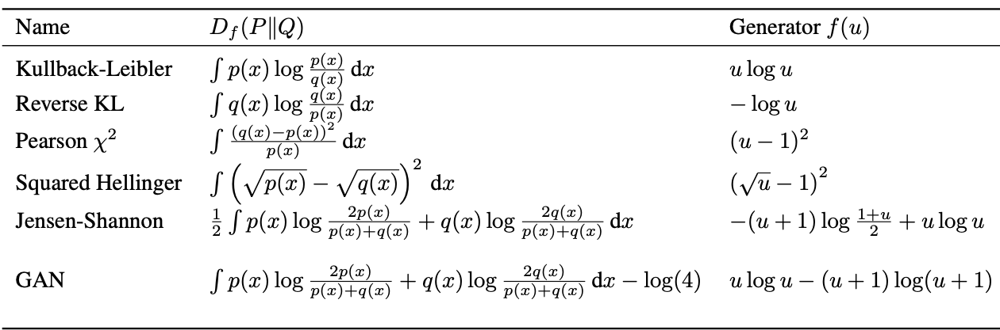

### `WGAN`


[WGAN](https://arxiv.org/abs/1701.07875) модель использует клиппинг весов для достижения Липшицевости функции критика.

Функция потерь
$$
\min_{G} W(\pi || p) \approx \min_{G} \max_{\boldsymbol{\phi} \in \boldsymbol{\Phi}} \left[ \mathbb{E}_{\pi(\mathbf{x})} f(\mathbf{x}, \boldsymbol{\phi})  - \mathbb{E}_{p(\mathbf{z})} f(G(\mathbf{z}, \boldsymbol{\theta}), \boldsymbol{\phi} )\right].
$$

Здесь $f(\mathbf{x}, \boldsymbol{\phi})$ модель критика. Веса критика $\boldsymbol{\phi}$ должны принадлежать компакту $\boldsymbol{\Phi} = [-c, c]^d$.

### `WGAN-GP`

[WGAN-GP](https://arxiv.org/pdf/1704.00028.pdf) модель использует gradient penalty для достижения Липшицевости функции критика

Функция потерь
$$
    W(\pi || p) = \underbrace{\mathbb{E}_{\pi(\mathbf{x})} f(\mathbf{x})  - \mathbb{E}_{p(\mathbf{x} | \boldsymbol{\theta})} f(\mathbf{x})}_{\text{original critic loss}} + \lambda \underbrace{\mathbb{E}_{U[0, 1]} \left[ \left( \| \nabla_{\hat{\mathbf{x}}} f(\hat{\mathbf{x}}) \|_2 - 1 \right) ^ 2\right]}_{\text{gradient penalty}},
$$
где сэмплы $\hat{\mathbf{x}}_t = t \mathbf{x} + (1 - t) \mathbf{y}$ с $t \in [0, 1]$ равномерно засэмплированы вдоль прямой соединяющей точки: $\mathbf{x}$ из распределения данных $\pi(\mathbf{x})$ и $\mathbf{y}$ распределения генератора $p(\mathbf{x} \mid \boldsymbol{\theta})$.

### `Пример на MNIST`

In [33]:
opt = ConfigDict()

# обучение
opt.n_epochs = 200
opt.batch_size = 64

# оптимизатор
opt.lr = 0.0002
opt.beta1 = 0.5
opt.beta2 = 0.999

# модель
opt.latent_dim = 100
opt.img_size = 28
opt.channels = 1
opt.img_shape = (opt.channels, opt.img_size, opt.img_size)

# обучение GAN
opt.lambda_gp = 10
opt.n_critic = 5
opt.clip_value = 0.01
opt.sample_interval = 2000

opt

batch_size: 64
beta1: 0.5
beta2: 0.999
channels: 1
clip_value: 0.01
img_shape: !!python/tuple
- 1
- 28
- 28
img_size: 28
lambda_gp: 10
latent_dim: 100
lr: 0.0002
n_critic: 5
n_epochs: 200
sample_interval: 2000

In [34]:
device = torch.device('cuda', 0) if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda', index=0)

In [35]:
path = '../../data/mnist'
os.makedirs(path, exist_ok=True)

forward_transform = transforms.Compose([
    transforms.Resize(opt.img_size), 
    transforms.ToTensor(), 
    transforms.Normalize([0.5], [0.5])
])

inverse_transform = transforms.Compose([
    transforms.Normalize([0.0], [2.0]),
    transforms.Normalize([-0.5], [1.0]),
    transforms.ToPILImage()
])

dataset = MNIST(path, train=True, download=True, transform=forward_transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=opt.batch_size, shuffle=True)

### `Генератор`

In [36]:
class Generator(torch.nn.Module):
    def __init__(self, config):
        super().__init__()
        
        self.config = config

        def block(in_feat, out_feat, normalize=True):
            layers = [torch.nn.Linear(in_feat, out_feat)]
            if normalize:
                layers += [torch.nn.BatchNorm1d(out_feat, 0.8)]
            layers += [torch.nn.LeakyReLU(0.2, inplace=True)]
            return layers

        self.model = torch.nn.Sequential(
            *block(config.latent_dim, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            torch.nn.Linear(1024, int(np.prod(config.img_shape))),
            torch.nn.Tanh()
        )

    def forward(self, z):
        images = self.model(z)
        images = images.view(images.shape[0], *self.config.img_shape)
        
        return images

### `Дискриминатор (критик)`

In [37]:
class Discriminator(torch.nn.Module):
    def __init__(self, config):
        super().__init__()
        
        self.config = config
        
        self.model = torch.nn.Sequential(
            torch.nn.Linear(np.prod(self.config.img_shape), 512),
            torch.nn.LeakyReLU(0.2, inplace=True),
            torch.nn.Linear(512, 256),
            torch.nn.LeakyReLU(0.2, inplace=True),
            torch.nn.Linear(256, 1),
        )

    def forward(self, image):
        image = image.flatten(start_dim=1)
        logits = self.model(image)
        
        return logits

### `Определение модели`

In [38]:
# Initialize generator and discriminator
generator = Generator(config=opt).to(device)
discriminator = Discriminator(config=opt).to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.beta1, opt.beta2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.beta1, opt.beta2))

In [39]:
generator, discriminator

(Generator(
   (model): Sequential(
     (0): Linear(in_features=100, out_features=128, bias=True)
     (1): LeakyReLU(negative_slope=0.2, inplace=True)
     (2): Linear(in_features=128, out_features=256, bias=True)
     (3): BatchNorm1d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
     (4): LeakyReLU(negative_slope=0.2, inplace=True)
     (5): Linear(in_features=256, out_features=512, bias=True)
     (6): BatchNorm1d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
     (7): LeakyReLU(negative_slope=0.2, inplace=True)
     (8): Linear(in_features=512, out_features=1024, bias=True)
     (9): BatchNorm1d(1024, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
     (10): LeakyReLU(negative_slope=0.2, inplace=True)
     (11): Linear(in_features=1024, out_features=784, bias=True)
     (12): Tanh()
   )
 ),
 Discriminator(
   (model): Sequential(
     (0): Linear(in_features=784, out_features=512, bias=True)
     (1): LeakyReLU(negative_sl

### `Gradient penalty`

In [40]:
def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    
    # Random weight term for interpolation between real and fake samples
    alpha = torch.rand((real_samples.size(0), 1, 1, 1), device=real_samples.device)
    
    # Get random interpolation between real and fake samples
    interpolates = torch.lerp(real_samples, fake_samples, alpha).requires_grad_(True)
    logits = D(interpolates)
    
    fake = torch.ones((real_samples.shape[0], 1), device=real_samples.device, requires_grad=False)

    # Get gradient w.r.t. interpolates
    gradients = torch.autograd.grad(
        outputs=logits,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True, retain_graph=True
    )[0]
    
    gradients = gradients.flatten(start_dim=1)
    gradient_penalty = torch.mean(
        torch.square(
            torch.linalg.norm(gradients, dim=1) - 1.0
        )
    )
    
    return gradient_penalty

### `Обучение`

Посмотреть результат обучения можно [по ссылке на wandb](https://wandb.ai/nakhodnov17/mmp_practicum_spring_2024%7CSeminar%2011%7CWGAN-GP/runs/o7qnv1aq)

In [41]:
# ----------
#  Training
# ----------

api = wandb.Api()
api.client.execute(
    api.CREATE_PROJECT,
    {
        'entityName': 'nakhodnov17',
        'name': 'mmp_practicum_spring_2024|Seminar 11|WGAN-GP',
        'access': 'USER_READ',
    },
)

wandb.init(
    entity='nakhodnov17',
    project='mmp_practicum_spring_2024|Seminar 11|WGAN-GP',
    save_code=True,
    name='WGAN-GP-MNIST'
)

batches_done = 0
try:
    for epoch in range(opt.n_epochs):
        for idx, (real_images, _) in enumerate(dataloader):
            real_images = real_images.to(device)

            # ---------------------
            #  Train Discriminator
            # ---------------------

            optimizer_D.zero_grad()

            # Sample noise as generator input
            z = torch.randn((real_images.shape[0], opt.latent_dim), device=device)

            # Generate a batch of images
            fake_images = generator(z)

            # Real images
            real_logits = discriminator(real_images)
            # Fake images
            fake_logits = discriminator(fake_images)
            # Gradient penalty
            gradient_penalty = compute_gradient_penalty(discriminator, real_images.detach(), fake_images.detach())
            # Adversarial loss
            d_loss = -torch.mean(real_logits) + torch.mean(fake_logits) + opt.lambda_gp * gradient_penalty

            d_loss.backward()
            optimizer_D.step()

            # -----------------
            #  Train Generator
            # -----------------
            
            # Train the generator every n_critic steps
            if idx % opt.n_critic == 0:
                optimizer_G.zero_grad()
                
                # Generate a batch of images
                fake_images = generator(z)

                # Loss measures generator's ability to fool the discriminator
                # Train on fake images
                fake_logits = discriminator(fake_images)
                g_loss = -torch.mean(fake_logits)

                g_loss.backward()
                optimizer_G.step()

                wandb.log(
                    {'G_loss': g_loss.item(), 'D_loss':  d_loss.item(), 'Penalty': gradient_penalty.item()}, 
                    step=batches_done
                )

                if batches_done % opt.sample_interval == 0:
                    fake_grid = transforms.functional.to_pil_image(
                        make_grid(fake_images, nrow=8, padding=0)
                    )
                    real_grid = inverse_transform(make_grid(real_images, nrow=8, padding=0))
                    
                    wandb.log({"Fake images": wandb.Image(fake_grid)}, step=batches_done)
                    wandb.log({"Real images": wandb.Image(real_grid)}, step=batches_done)
                    
                batches_done += opt.n_critic
except KeyboardInterrupt:
    pass

wandb.finish()

wandb: Currently logged in as: nakhodnov17. Use `wandb login --relogin` to force relogin


D_loss,▁▁▄▅▅▆▆▆▆▇▇▇▇▇▇▆▇██▇▇▇▇▇▇▇█▇█▇▇▇█▇▇█▇▇▇█
G_loss,▇█▆▃▁▂▃▂▁▁▃▃▂▂▃▃▂▂▂▂▃▃▃▃▂▂▃▃▂▂▂▂▃▂▃▂▃▂▃▄
Penalty,█▆▃▂▃▂▂▁▂▂▁▂▂▁▁▁▁▂▁▁▂▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁
D_loss,-1.00936
G_loss,-1.8709
Penalty,0.00726


In [42]:
torch.save({
        "generator": generator.state_dict(),
        "discriminator": discriminator.state_dict()
    }, "checkpoint.pth"
)